<a href="https://colab.research.google.com/github/Ali-Banihashemi/Unsupervised-Learning-and-Quantum-Neural-Networks/blob/main/AI-Project2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Artificial Intelligence Course- 2024**

# **Project 2**




In [ ]:
from google.colab import drive
drive.mount('/content/drive')

## **Part I**

Clustering is basicaly a data analysis algorithm which group datasets into clusters. The elements of each cluster are similar to each other in some aspects and they are diffrent from elements in the other clusters.

This technique is mostly used in unsupervised learning models.

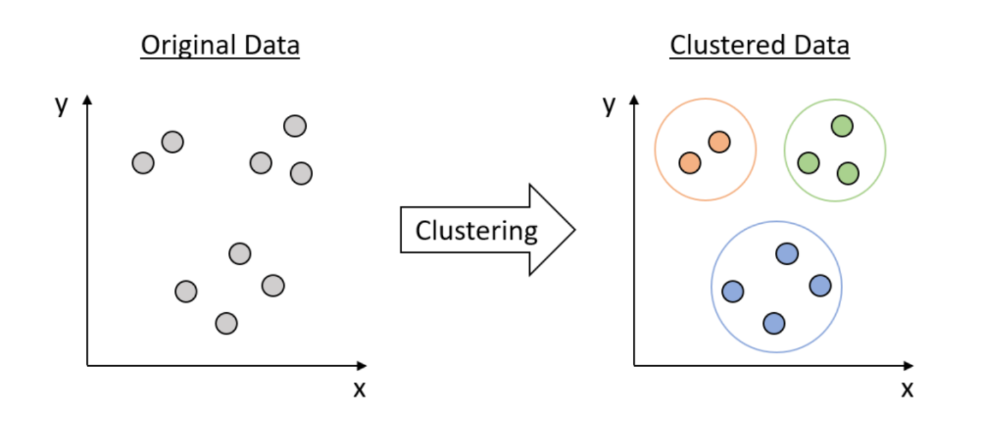

In [ ]:
from IPython.display import Image
Image(filename='/content/drive/MyDrive/AI-Project2/Clustering.png',width=700,height=400)

There are different clustering algorithms. Some of them are K-Means Clustering , Hierarchical Clustering and Density-Based Spatial Clustering(DBSCAN).

As we know about the challenges with K-Means clustering that we should predefine number of clusters and also this algorithm always tries to have same number of elements in each cluster we can use Hierarchial Clustering.

In Hierarchical clustering there is no need to define the number of clusters at first. Let's take a look on how this algorithm works:


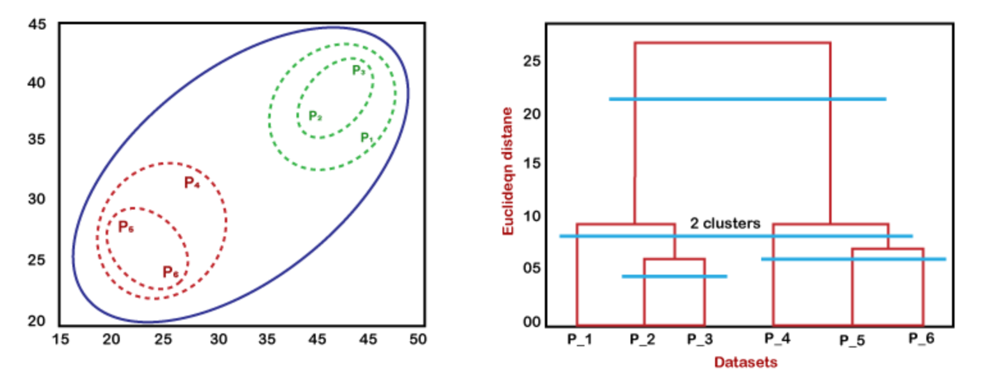

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/HierarchicalClustering.png',width=700,height=300)

Suppose we have 6 points (shown as P1:P6 in the image above).

In this algorithm the main concept is to find two most similar clusters and merge them into one bigger cluster. In the first step every single point is considered as a cluster. Then we merge two nearest clusters(in this case P2 and p3) and move on until we reach the end goal of only one big cluster which is devided to diffrent levels of clusters inside it as the name Hierarchical suggests. We have a tree like structure of clusters which we can see a big cluster that after passing some levels we reach the actual single datas. This structure is called a dendogram(shown in the right part of the picture).



Let's see an example for a better understanding of this case:

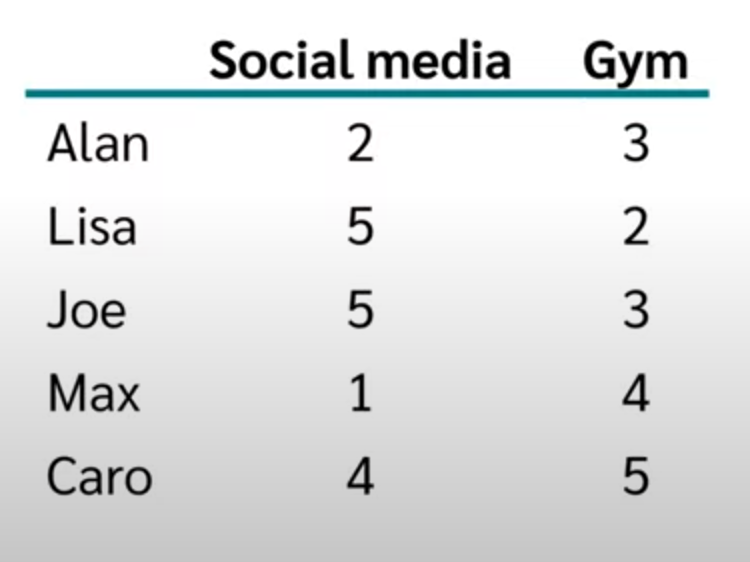

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/HiEX1.png',width=400,height=300)

We have 5 people in this example and we asked them about the hours they use social media in a day and the hours they spend in the gym. This data is shown in the picture above. NOw we want to cluster them using hierarchical clustering. First let us see this data on a two dimention graph.

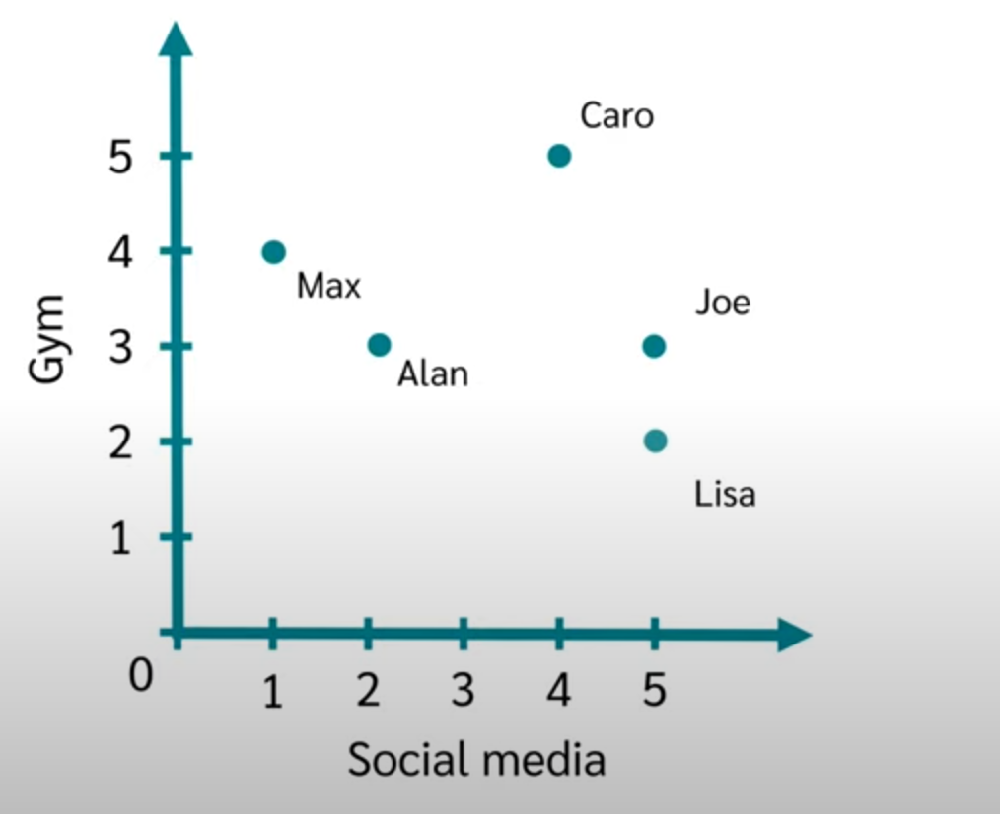

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/HiEX2.png',width=400,height=300
      )

As we can see in this graph closest points are Lisa and Joe and the second pair are Max and Alan. There is an acurrate formula to calculate the distance between two points in any number of dimentions, in two dimention space it is:

**d=√((x2 – x1)² + (y2 – y1)²)**

So after calculating the distances between all the given points(we consider each of them as a cluster now) we make our first two clusters.


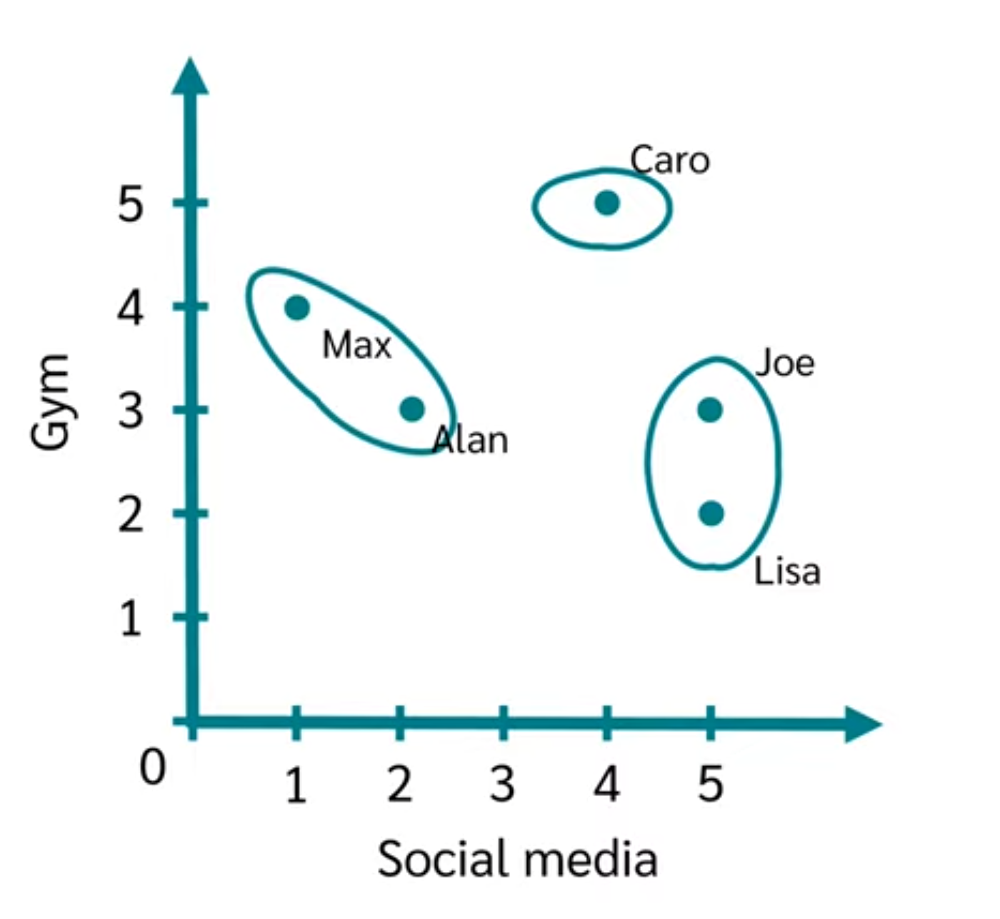

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/HiEX3.png',width=400,height=300
      )

Now we should find the closest pair in these 3 clusters and merge them into one. In the last step we have only two clusters and we merge them without any calculation. In this case ((Joe),(Lisa)) cluster will be merged with (caro) and the last two clusters ((Max),(Alan)) and ((Joe,Lisa),(Caro)) will be merged together. After all we can take a look at our dendogram.

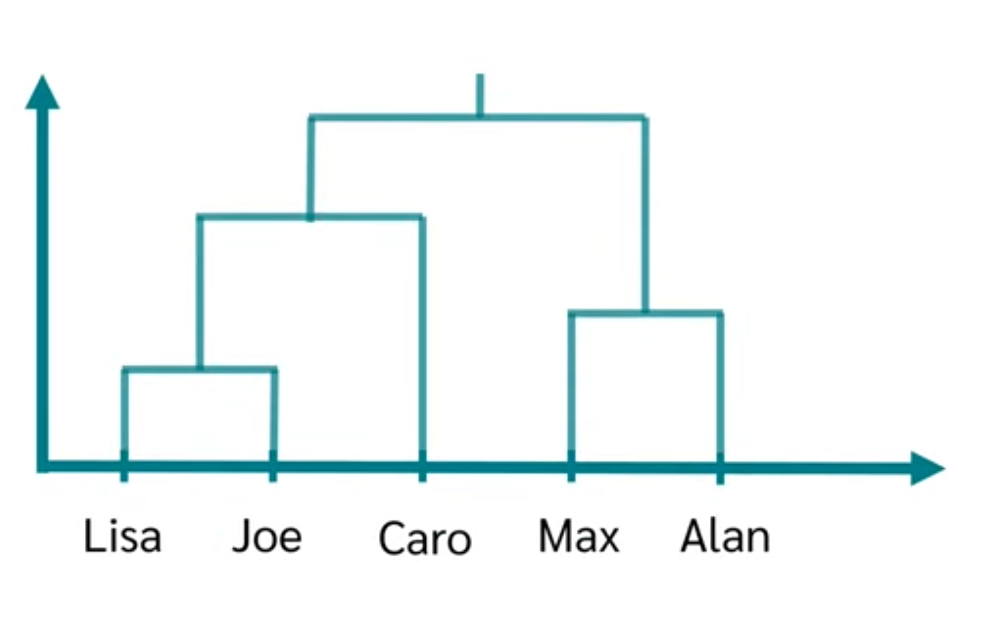

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/HiEX4.png',width=500,height=300)

So, Now we shall discuss the DBSCAN clustering.

In DBSCAN we have a different approach. In this algorithm we consider neighbour datas as clusters although in the end the distances between datas in one group may be more than distance of two datas in different groups.

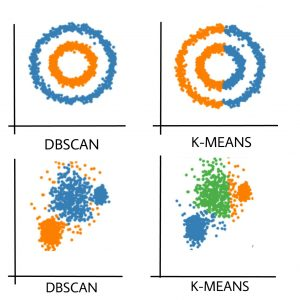

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/DBSCAN.jpg',width=400,height=400)

It's obvious for human eyes to find different clusters based on this algorithm. It's just looking at 2D graph and naming all the datas that are staying together as a group. But as we need an algorithm to program this process and also as they may be more than 4 features(a 4D graph could not be drawn) we should find an algorithm for this job as well.

This algorithm first find the points that have at least N number of neighbours. This N should be determined by us. We call these points core points. Then starting from a core point , we put it in a cluster. Then we expand this cluster by adding the neighbour core point and we expand until no other neighbour core points left. Then we add normal points that are neighbour to one of the core points in this cluster and this cluster is finished. Then we continue to make other clusters by not used core points. Let's take a look at an example:

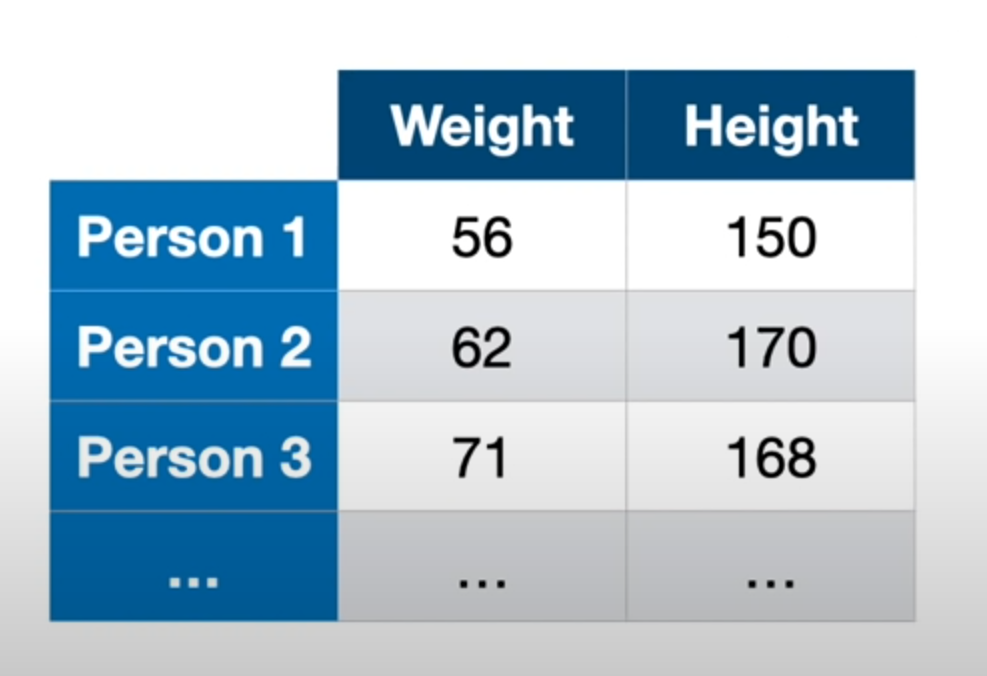

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/DBEX1.png',width=400,height=300)

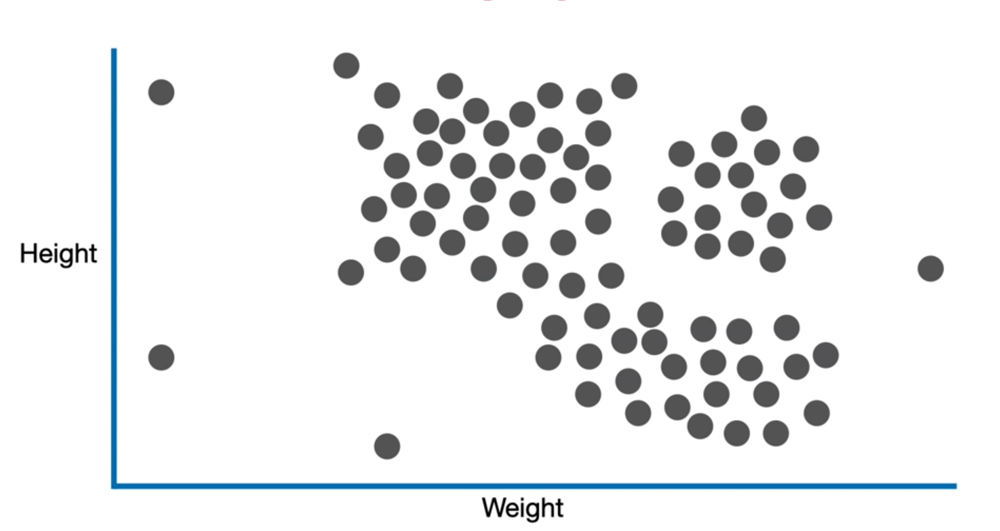

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/DBEX2.png',width=500,height=300)

Assume we have a dataset containing people datas and the features are height and weight. Then we plot them on a 2D graph.

Taking a look we can identify two big chunks as a cluster but let's see how the algorithm finds these clusters.

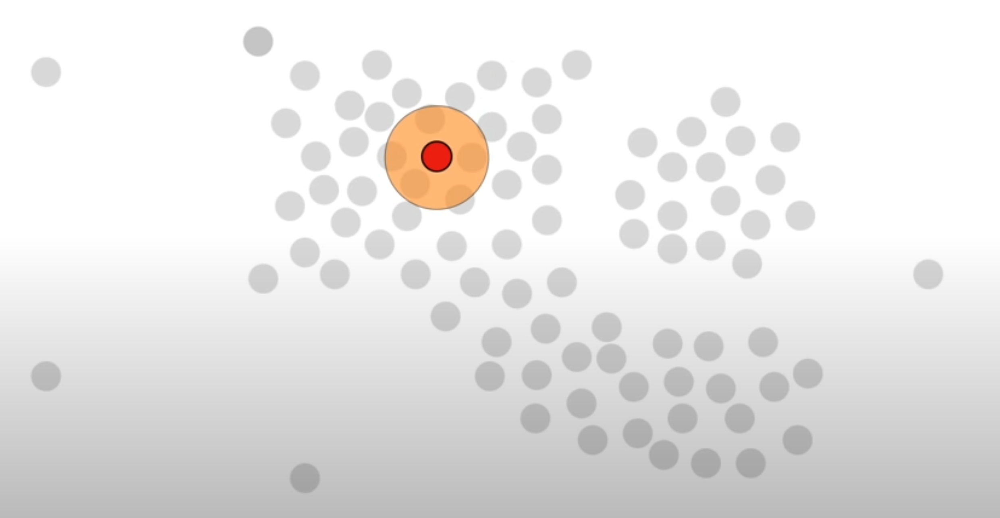

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/DBEX3.png',width=600,height=300)

A random point can be the red one shown here. We form an orange circle around it and find whether there are enough points in this circle or not. In this case N=4 and we call any point that has at least 4 numbers a core point. We do this test for all the points and find all the core points.


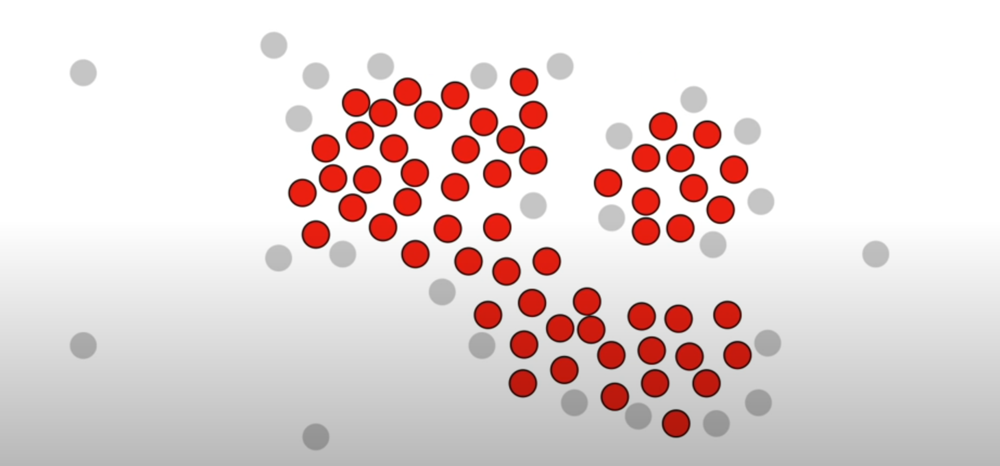

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/DBEX4.png',width=600,height=300)

Now we can see all of the core points.

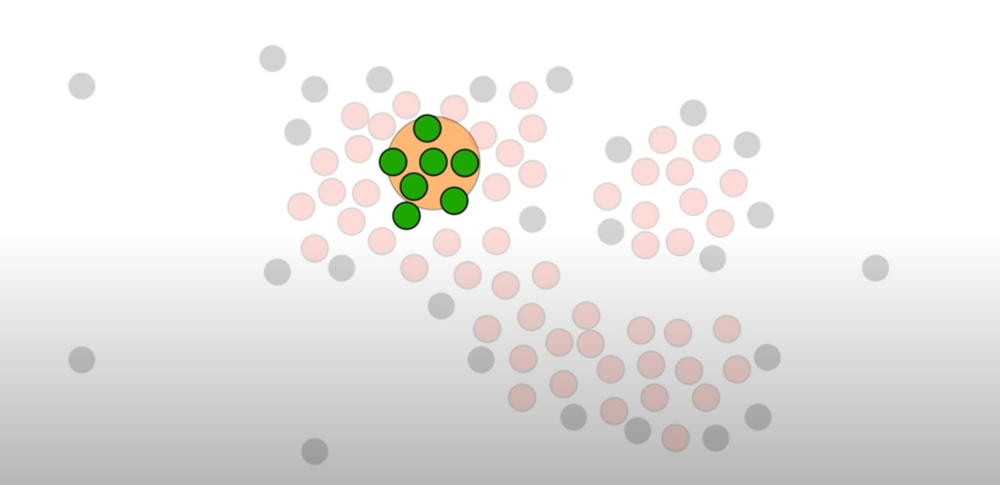

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/DBEX5.png',width=600,height=300)

Now we choose the same first point and we expand on it's neighbours which are core points until we have no more core point neighbours. Then we add all the normal neighbour points one time. The neighbours of these points wont be in the cluster.

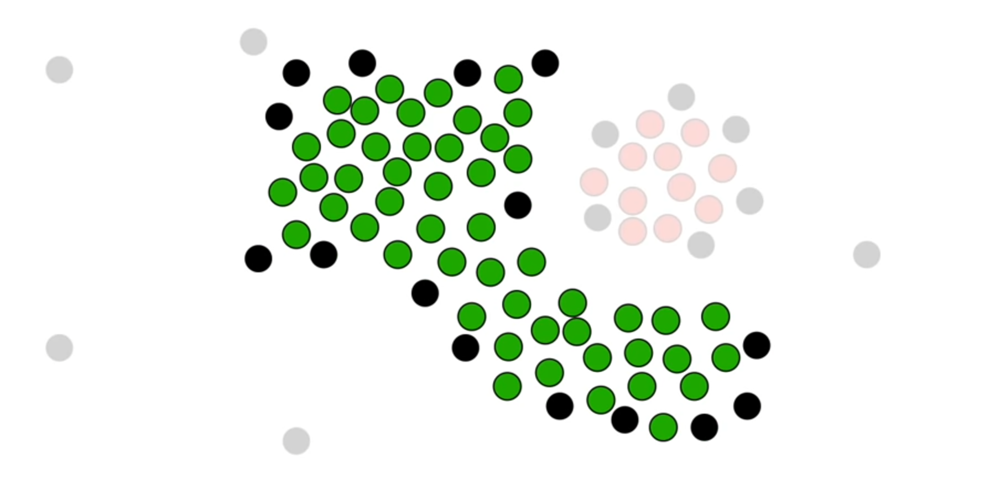

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/DBEX6.png',width=600,height=300)

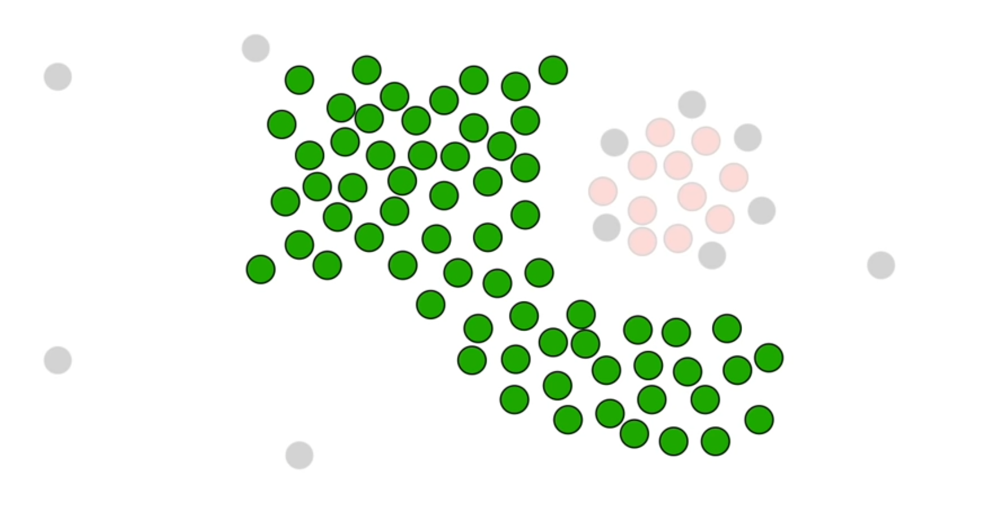

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/DBEX7.png',width=600,height=300)

After making our first cluster we continue with remaining core points and we try to find more clusters.

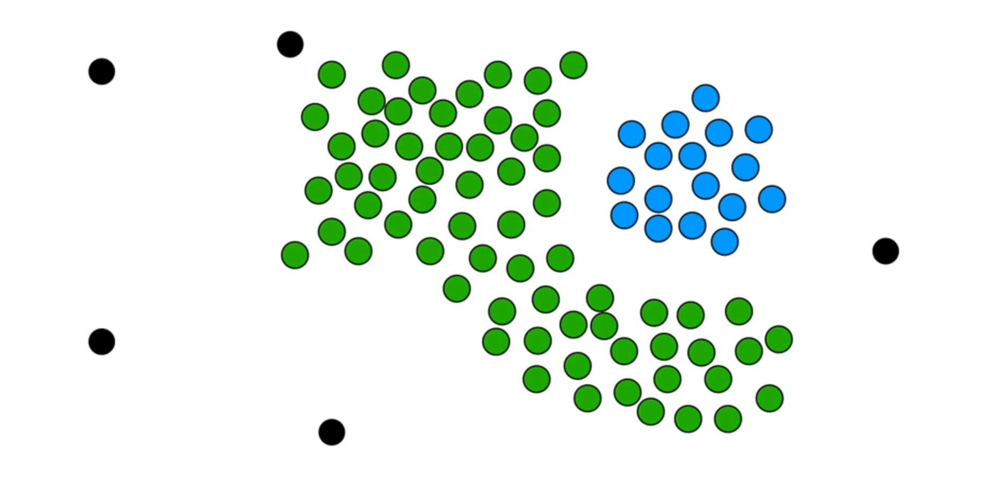

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/DBEX8.png',width=600,height=300)

Now we have two clusters and some outliers.

Let's continue with the implementations:

**K-Means Clustering**

**1 - Imports**

We need pandas and numpy as well as matplot for plotting and Kmeans from sklearn.cluster for clustering

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

**2 - Read the data file**

In [ ]:
dataset = pd.read_excel('/content/drive/MyDrive/AI-Project2/UnSup.xlsx')

**3 - Ignore Warnings**

We will get warning when changing n_cluster in a loop

In [ ]:
import warnings
warnings.filterwarnings('ignore')

**4 - Check the data**

In [ ]:
dataset.tail(10)

,ID,AGE,EDUC,MARRIED,KIDS,LIFECL,OCCAT,RISK,HHOUSES,WSAVED,SPENDMOR,NWCAT,INCCL
3856,3857,2,1,1,3,3,3,4,1,1,5,2,4
3857,3858,3,3,2,0,1,1,2,1,3,1,1,2
3858,3859,3,3,2,0,1,1,2,1,3,1,2,2
3859,3860,4,4,2,0,5,1,3,1,1,4,2,4
3860,3861,3,3,2,0,1,3,4,0,1,5,1,2
3861,3862,3,1,1,1,3,1,4,0,2,3,1,3
3862,3863,3,1,1,1,3,1,4,0,2,3,1,4
3863,3864,5,1,1,0,5,1,4,0,3,5,1,4
3864,3865,2,4,1,7,3,1,3,1,3,2,5,5
3865,3866,3,4,2,0,1,2,2,1,2,5,4,4


**5 - Construct the dataframe**

We are not including row number 0 which contains IDs as they are not valuable features.

In [ ]:
df = dataset.iloc[:, [1,2,3,4,5,6,7,8,9,10,11,12]].values

**6 - Find number of clusters**

We use elbow method and plot the values to find optimal number of clusters.

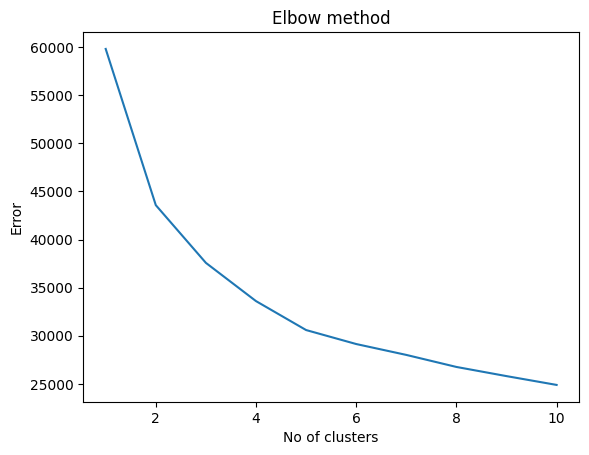

In [ ]:
Error =[]
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i).fit(df)
    kmeans.fit(df)
    Error.append(kmeans.inertia_)
import matplotlib.pyplot as plt
plt.plot(range(1, 11), Error)
plt.title('Elbow method')
plt.xlabel('No of clusters')
plt.ylabel('Error')
plt.show()

**7 - Clustering**

We use the plot above to find the number of clusters and it is probably between 2 and 4. To find the exact number it is better to check the score and plot for all theswe numbers.

In [ ]:
kmeans2 = KMeans(n_clusters=2)
y_kmeans2 = kmeans2.fit_predict(df)

In [ ]:
kmeans3 = KMeans(n_clusters=3)
y_kmeans3 = kmeans3.fit_predict(df)

In [ ]:
kmeans4 = KMeans(n_clusters=4)
y_kmeans4 = kmeans4.fit_predict(df)

**8 - Evaluating**

Silhouette Score is a way to measure how well the clusters are seperated and distinguished. It ranges between -1 and 1, the closer the score gets to 1, our clusters are better.

In [ ]:
from sklearn.metrics import silhouette_score

print('2 clusters:',silhouette_score(df, y_kmeans2))
print('3 clusters:',silhouette_score(df, y_kmeans3))
print('4 clusters:',silhouette_score(df, y_kmeans4))


2 clusters: 0.2544089264150241
3 clusters: 0.20215644186231574
4 clusters: 0.18506368370531714


**9 - Plotting**

As we have many features and we can only see 2 dimensions, we are going to reduce the features using PCA library.

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_components = pca.fit_transform(df)

df_pca = pd.DataFrame(data=pca_components, columns=['PC1', 'PC2'])

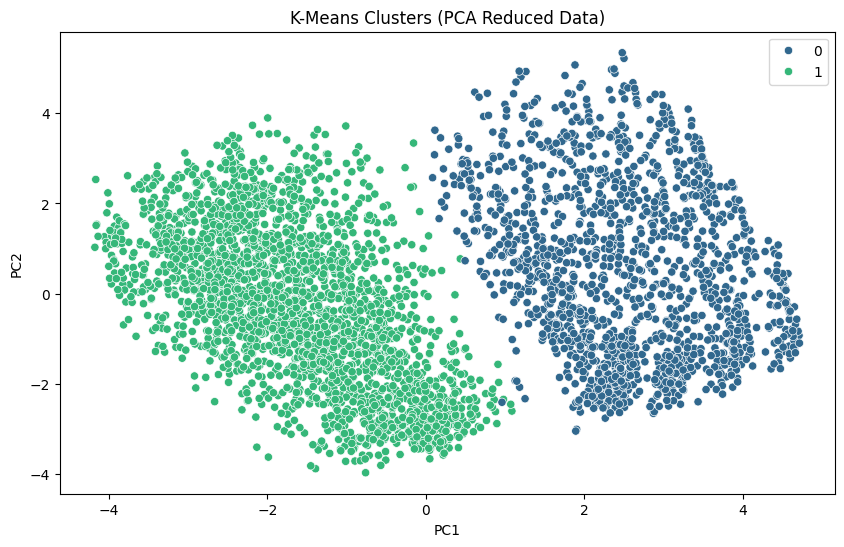

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue=y_kmeans2, palette='viridis', data=df_pca, legend='full')
plt.title('K-Means Clusters (PCA Reduced Data)')
plt.show()

**Hierarchical Clustering**

**1:5 - Imports and Dataframe**

We have all 5 same steps of the K-Means clustering to construct our dataframe.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

dataset = pd.read_excel('/content/drive/MyDrive/AI-Project2/UnSup.xlsx')

import warnings
warnings.filterwarnings('ignore')

dataset.tail(10)

df = dataset.iloc[:, [1,2,3,4,5,6,7,8,9,10,11,12]].values

**6 - Perform the clustering**

We first make the hierarchy using linkage and then cluster them based on the hierarchy levels.

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

linked = linkage(df, method='ward')


hierarchical = fcluster(linked, t=2, criterion='maxclust')

**7 - Plotting the dendogram**

We plot dendogram, but beacuse the number of samples are not low it's now completely visible.

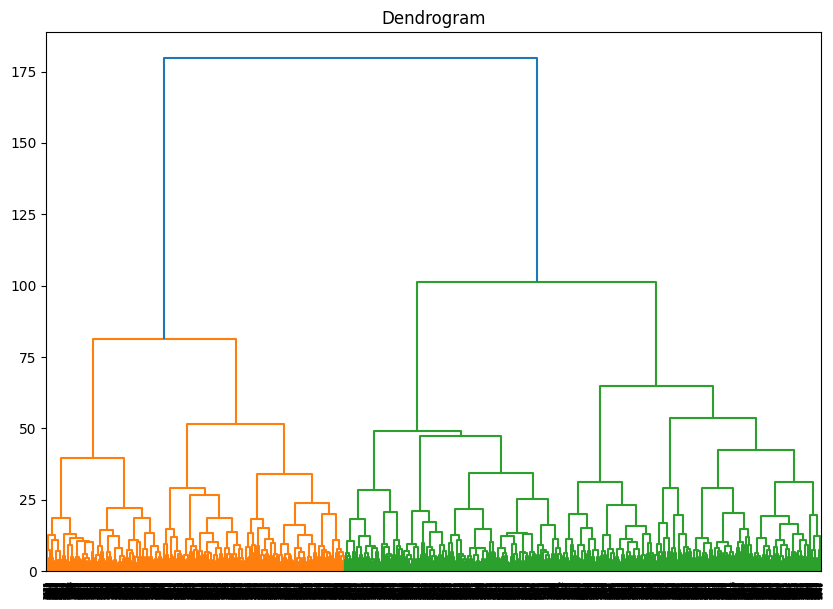

In [ ]:
plt.figure(figsize=(10, 7))
dendrogram(linked)
plt.title('Dendrogram')
plt.show()

**8 - Evaluating**

We use Silhouette Score.

In [ ]:
from sklearn.metrics import silhouette_score
print('Hierarchical Clustering:',silhouette_score(df, hierarchical))

Hierarchical Clustering: 0.25301872802863845


**DBSCAN Clustering**

**1:5 - Imports and Dataframe**

We have all 5 same steps of the K-Means clustering and Hierarchical clustering.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

dataset = pd.read_excel('/content/drive/MyDrive/AI-Project2/UnSup.xlsx')

import warnings
warnings.filterwarnings('ignore')

dataset.tail(10)

df = dataset.iloc[:, [1,2,3,4,5,6,7,8,9,10,11,12]].values

**6 - Perform the clustering**

There are some ways to find the optimal value for eps and min_samples but an easy way is just changing it and see how silhouette score changes.

In [ ]:
dbscan = DBSCAN(eps=2, min_samples=30)
dbscan_v = dbscan.fit_predict(df)

**7 - Evaluating**

We use Silhouette Score.

In [ ]:
from sklearn.metrics import silhouette_score
print('DBSCAN Clustering:',silhouette_score(df, dbscan_v))

DBSCAN Clustering: 0.10190990436533921


**8 - Plotting**

We do the same thing as we did in K-Means clustering.

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_components = pca.fit_transform(df)

df_pca = pd.DataFrame(data=pca_components, columns=['PC1', 'PC2'])


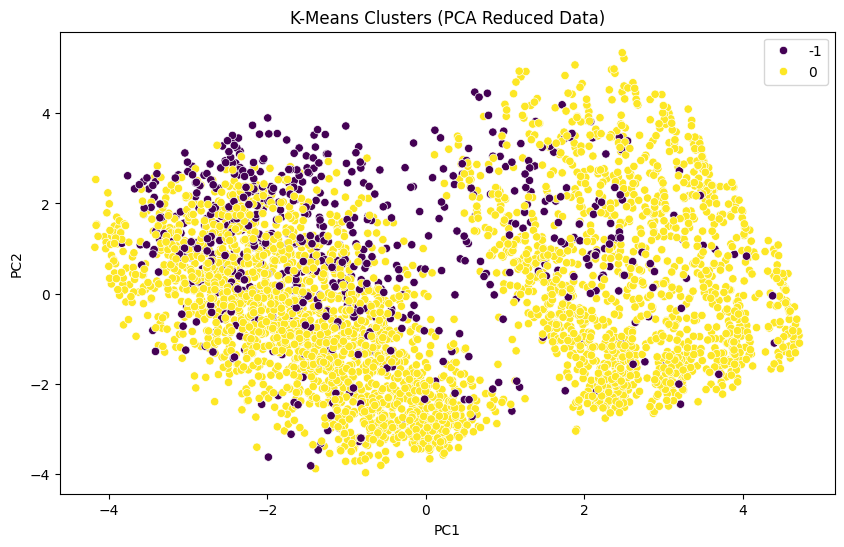

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue=dbscan_v, palette='viridis', data=df_pca, legend='full')
plt.title('K-Means Clusters (PCA Reduced Data)')
plt.show()

After all we can see in this example K-Means and Hierarchical clustering are working pretty much the same but DBSCAN clustering is not working as well as them and that could be because of many features and dbscan can get confused.

## **Part II**

Gini Impurity Index is a measurment which shows how diverse is a dataset. In simple terms it caculates how much is the probability of getting same data after picking two random datas.

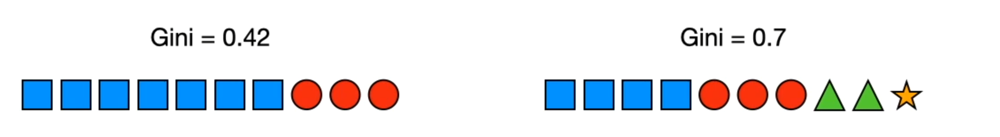

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/Gini2.png',width=700,height=100)

Taking a look at the above example, it is obvious that after picking two random shapes(we can pick one twice) it is more probable that we get different shapes in the right group. Another way of saying this is , it is more probable that we get the same shape in the left group.

In Gini Impurity Index formula we basicaly find the probability of getting the same data and then we substract it from 1 which gives us the probability of having diffrent elements in a random pair. It's fairly easy to do this calculation as we just need to sum the squres of number of elements in each class. In the left group there are 7 squares. We have probability of 0.7 to pick one in the first step and 0.7 to pick one in the next step, so in total probabilty of picking square two times in a row is 0.7*0.7 = 0.49 and we do the same for the circle and it's 0.3 * 0.3 = 0.09. So in total we have probability of 0.49 + 0.09 = 0.58 of choosing the same shape twice. Then we substract it from 1 : 1 - 0.58 = 0.42. So we have probability of 0.42 to choose diffrent shapes.

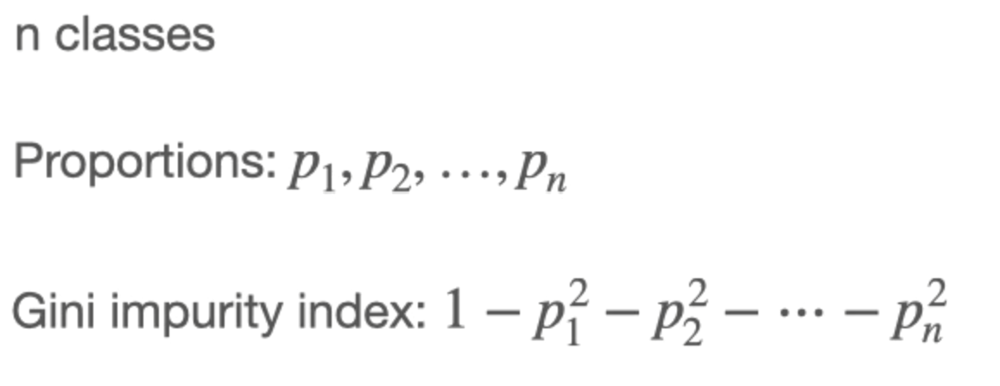

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/Gini1.png',width=400,height=200)

In [ ]:
Emotion=['sick','sick','notsick','notsick','notsick','sick','notsick','notsick']
df=pd.DataFrame (list(zip(Emotion)),
                columns=["Emotion"])
df.sort_values(['Emotion'],inplace=True)
print(df)

   Emotion
2  notsick
3  notsick
4  notsick
6  notsick
7  notsick
0     sick
1     sick
5     sick


In [ ]:
def gini_impurity(labels):
    _, counts = np.unique(labels, return_counts=True)
    probabilities = counts / counts.sum()
    return 1 - np.sum(probabilities**2)
print("Sick Gini Impurity:",gini_impurity(Emotion))

Sick Gini Impurity: 0.46875


So, Let's see where the entropy works better although you're gonna have a hard time finding an example that these two works differently.

In this case we are creating our own unbalanced data to see this problem. Suppose we have 2 classes and 2 features. Using the make_classification function we make our data.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.datasets import make_classification
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt

X, y = make_classification(n_samples=500, n_features=2, n_informative=2, n_redundant=0,
                           n_clusters_per_class=1, weights=[0.9, 0.1], flip_y=0, random_state=42)
df = pd.DataFrame(X, columns=['1', '2'])
df['Label'] = y

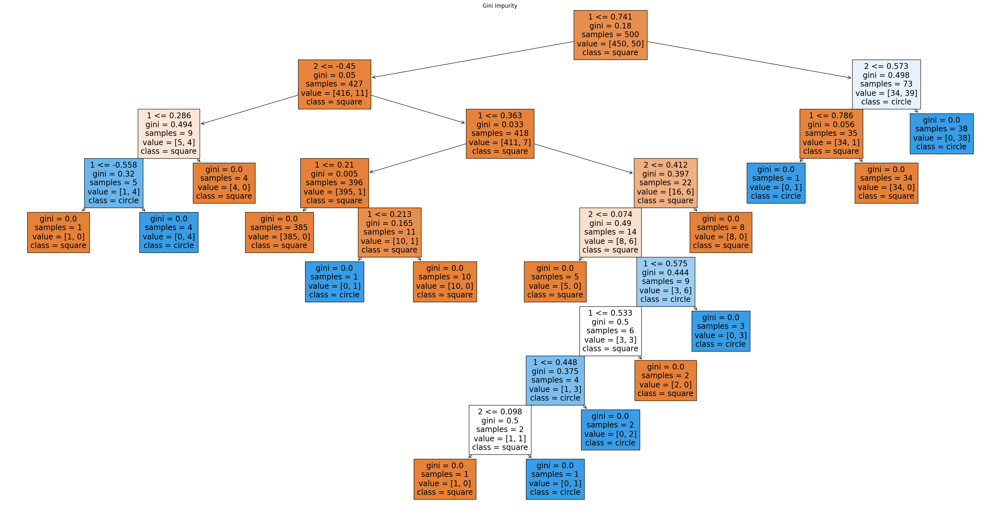

In [ ]:
tree_gini = DecisionTreeClassifier(criterion='gini', random_state=42)
tree_gini.fit(X, y)

plt.figure(figsize=(40,20))
plot_tree(tree_gini, filled=True, feature_names=['1', '2'], class_names=['square', 'circle'])
plt.title('Gini Impurity')
plt.show()

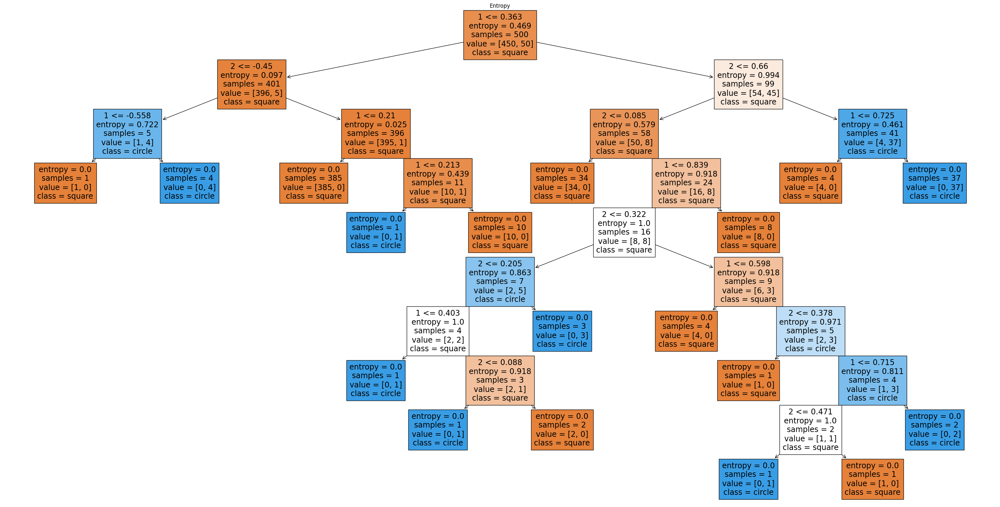

In [ ]:
tree_entropy = DecisionTreeClassifier(criterion='entropy', random_state=42)
tree_entropy.fit(X, y)

plt.figure(figsize=(40,20))
plot_tree(tree_entropy, filled=True, feature_names=['1', '2'], class_names=['square', 'circle'])
plt.title('Entropy')
plt.show()

We continue by making a Decision Tree and Random Forest Models for Assignment 1 dataset.

The imports are fimilar. SimpleImputer is just to remove NaN datas as they will cause errors.

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.impute import SimpleImputer

Loading the dataset

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/AI-Project2/Assignment.csv')
print(df.head())

   F1  F2  F3  F4  F5  F6  F7  F8  F9  F10  ...  F86  F87   F88  F89   F90  \
0   1   7   2  29   2   6   0   0   0   81  ...    0   66  6401    4  21.0   
1   1  28   0  42   2   4   0   0   0   14  ...   36   63  3413    4  15.0   
2   1   7   0  42   2   4   0   0   0   10  ...   36   63  3413    4  15.0   
3   1  28   0  42   2   4   0   0   0   11  ...   36   63  3413    4  15.0   
4   2   7   0  42   2   6   0   0   0   13  ...   36   63  3413    4  15.0   

   F91  F92  Target  Unnamed: 93  Unnamed: 94  
0    0    2       2          NaN          NaN  
1   36    1       2          NaN          NaN  
2   36    1       2          NaN          NaN  
3   36    1       2          NaN          NaN  
4   36    1       2          NaN          NaN  

[5 rows x 95 columns]


Constructing data and labels based on Target column

In [ ]:
X = df.drop('Target', axis=1)
y = df['Target']

Removing NaN types based on simple mean

In [ ]:
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

Splitting the data

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)

We construct decision tree and then we use predict on the test data for evaluation

In [ ]:
decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(X_train, y_train)
tree_t = decision_tree.predict(X_test)

After that we just use classification_report function to see a report on how well our model works

In [ ]:
print(classification_report(y_test, tree_t))

              precision    recall  f1-score   support

           0       0.70      0.70      0.70     17294
           1       0.62      0.61      0.62      5376
           2       0.62      0.62      0.62     10722

    accuracy                           0.66     33392
   macro avg       0.65      0.64      0.65     33392
weighted avg       0.66      0.66      0.66     33392



In [ ]:
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
random_forest.fit(X_train, y_train)
forest_t = random_forest.predict(X_test)

In [ ]:
print(classification_report(y_test, forest_t))

              precision    recall  f1-score   support

           0       0.72      0.77      0.74     17294
           1       0.67      0.65      0.66      5376
           2       0.69      0.61      0.65     10722

    accuracy                           0.70     33392
   macro avg       0.69      0.68      0.68     33392
weighted avg       0.70      0.70      0.70     33392



As we can see the accuracy of random forest is a little bit better. Usually random forests works better than a single dicision tree.

Let's take a look at tree dicision in regression problems. This job is similar to a classification in some aspects.

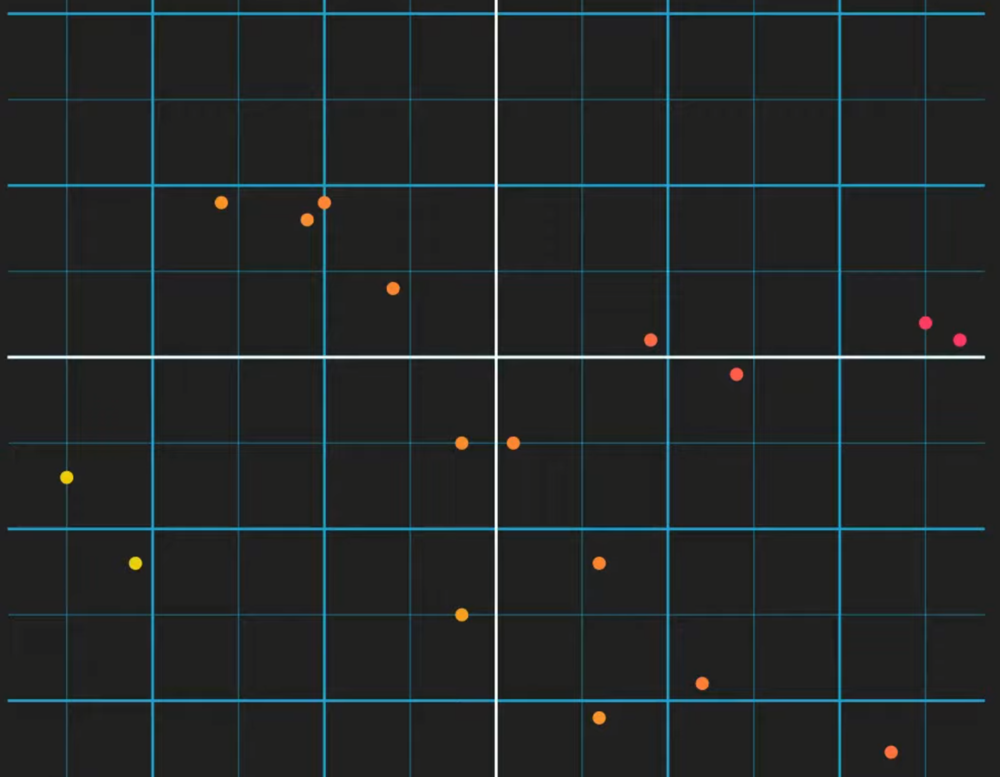

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/tree2.png',width=400,height=400)

In this problem we have some datas with three features. First and second feature are shown on x and y axis. We want to predict the third feature which is color and it's not a discrete number so we can't use classifier and we should use regression.

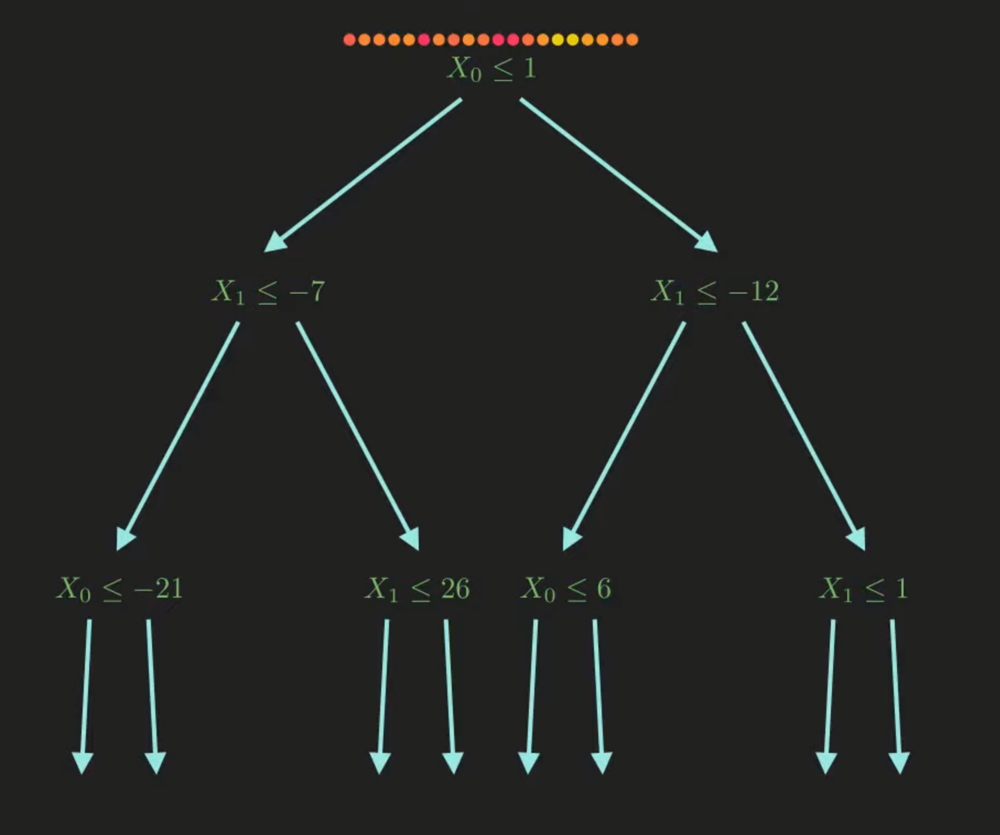

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/tree1.png',width=400,height=400)

In this case we want to split our data based on a point. Here we are choosing one of the points and later we will talk about how we should choose the right point.

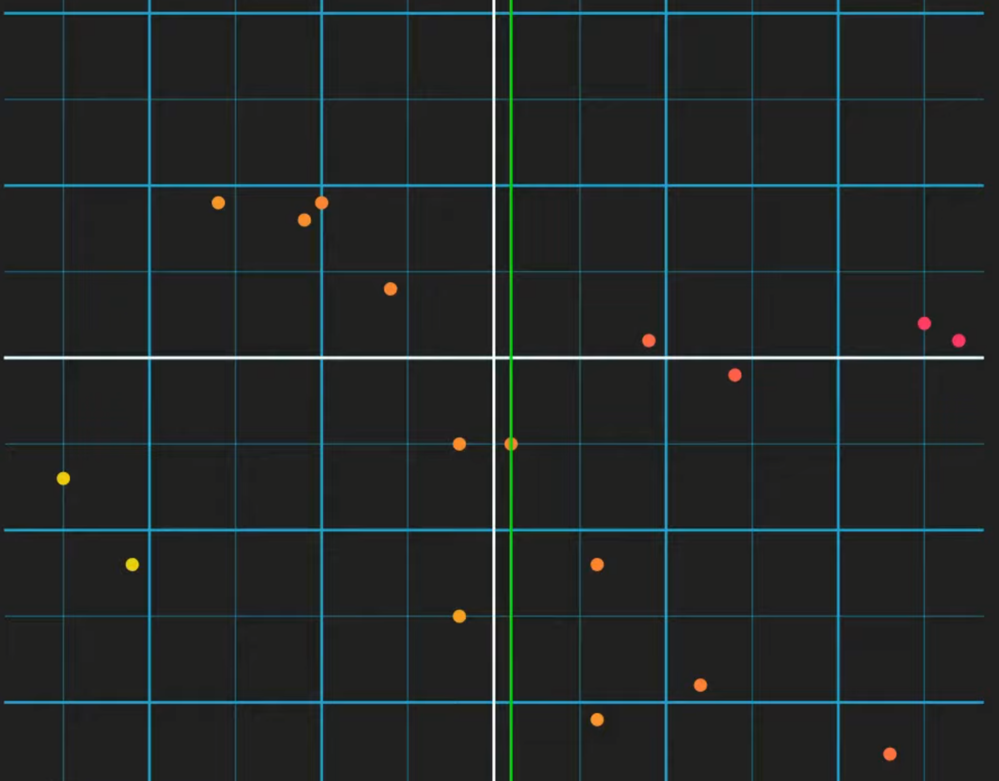

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/tree4.png',width=400,height=400)

after choosing this point we want to split other points based on which side of this point they located.

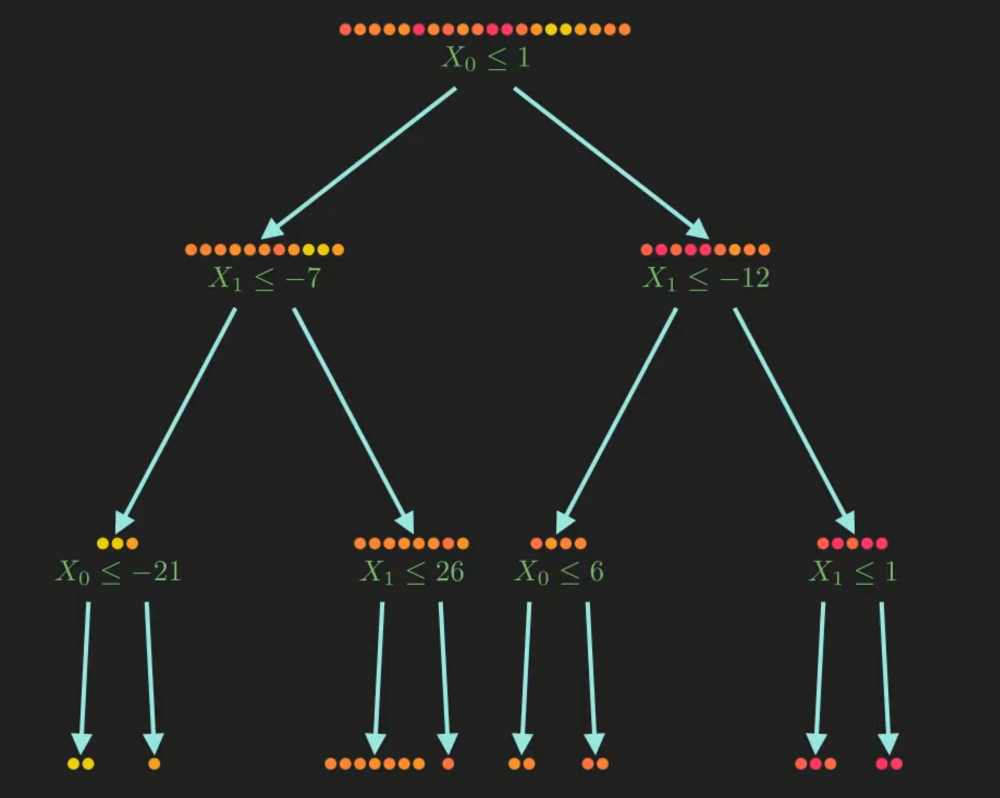

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/tree5.png',width=450,height=400)

After doing the whole job we can see how well our points are devided. The only problem left is how we can choose each point to create a good tree. It's fairly easy. After each step we want our two groups to be as similar as possible(in this case the similarity is color). So variance can be a good measurment. as we have used entropy or Gini in classification problem here we want to have least amount of variance in each group after division. After doing these the 2D graph will be devided into regions which all the points in  that region will be assigned to the same color.

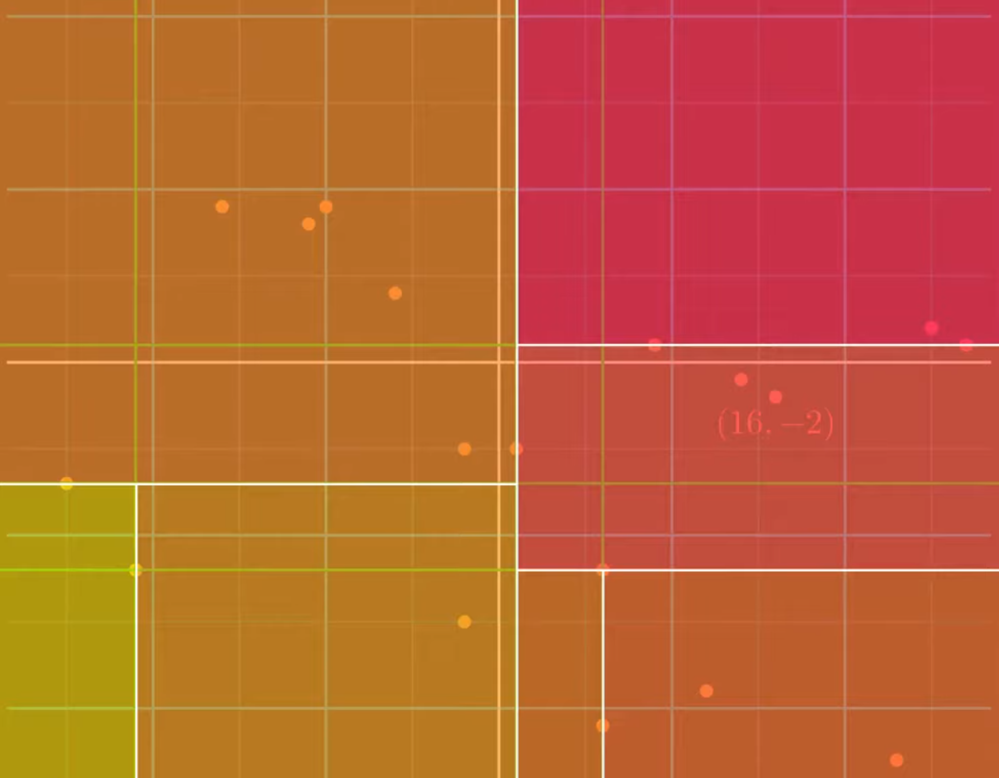

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/tree6.png',width=450,height=400)

**1- Imports**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

**2- Import dataset and construct dataframe**

In [ ]:
from sklearn.datasets import fetch_openml
boston = fetch_openml(name='boston', version=1)

df = pd.DataFrame(boston.data, columns=boston.feature_names)
df['PRICE'] = boston.target

print(df.head())

      CRIM    ZN  INDUS CHAS    NOX     RM   AGE     DIS RAD    TAX  PTRATIO  \
0  0.00632  18.0   2.31    0  0.538  6.575  65.2  4.0900   1  296.0     15.3   
1  0.02731   0.0   7.07    0  0.469  6.421  78.9  4.9671   2  242.0     17.8   
2  0.02729   0.0   7.07    0  0.469  7.185  61.1  4.9671   2  242.0     17.8   
3  0.03237   0.0   2.18    0  0.458  6.998  45.8  6.0622   3  222.0     18.7   
4  0.06905   0.0   2.18    0  0.458  7.147  54.2  6.0622   3  222.0     18.7   

        B  LSTAT  PRICE  
0  396.90   4.98   24.0  
1  396.90   9.14   21.6  
2  392.83   4.03   34.7  
3  394.63   2.94   33.4  
4  396.90   5.33   36.2  


**3- Creating Labels set**

In [ ]:
X = df.drop('PRICE', axis=1)
y = df['PRICE']

**4- Splitting the data**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

**5- Build the decision tree**

In [ ]:
decision_tree = DecisionTreeRegressor(random_state=42)
decision_tree.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

**6- Evaluate the tree**

In [ ]:
y_pred_dt = decision_tree.predict(X_test)
mse_dt = mean_squared_error(y_test, y_pred_dt)
print(f"Mean Squared Error: {mse_dt}")

Mean Squared Error: 11.588026315789474


**7- Build the Random forest**

In [ ]:
random_forest = RandomForestRegressor(n_estimators=100, random_state=42)
random_forest.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

**8- Evaluate the forest**

In [ ]:
y_pred_rf = random_forest.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f"Mean Squared Error: {mse_rf}")

Mean Squared Error: 9.619662013157892


Forest is working better in this case as well.

## **Part III**

Basis encoding is the most simple encoding technique to encode classical data for quantum computing. This technique is similar to what we do in binary numbers. We first make our data binary then we turn it into the corresponding basis vector. Thats a straight forward approach.

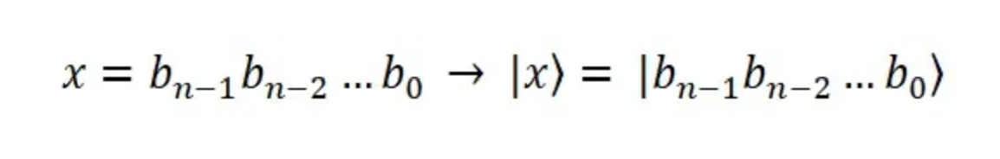

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/basis.png',width=600,height=100)

It's implementation is easy as well. We just need n qbits in our circuit.(n = number of bits in our binary number). Then for each 1 in the number we need an X gate in the circuit to turn 0 to encode |1⟩ state. And that's it.

In [ ]:
pip install qiskit

In [ ]:
from qiskit import QuantumCircuit

In [ ]:
binary_vector = [1, 0, 1 , 0]

qc_basis = QuantumCircuit(4)

for i, bit in enumerate(binary_vector):
    if bit == 1:
        qc_basis.x(i)

In the amplitude encoding there are less number of bits. That's because we won't waste any bits. As we know we may have many numbers but we are just working with a few. So we can encode them based on their appreance and it's not just about the numbers. Suppose we have 8 features that we want to encode. In the basis encoding we save the absolute value of them how ever in the amplitude encoding it's about the probabilities. We can have 3 bits that handle these 8 features as we can represent 8 different numbers using 3 bits. So in amplitude encoding we need log(n) number of bits(that's because n numbers can be represented by an log(n) bit binary number. The only thing is we should normalize the values so that the sum of the squares of the components equals 1.

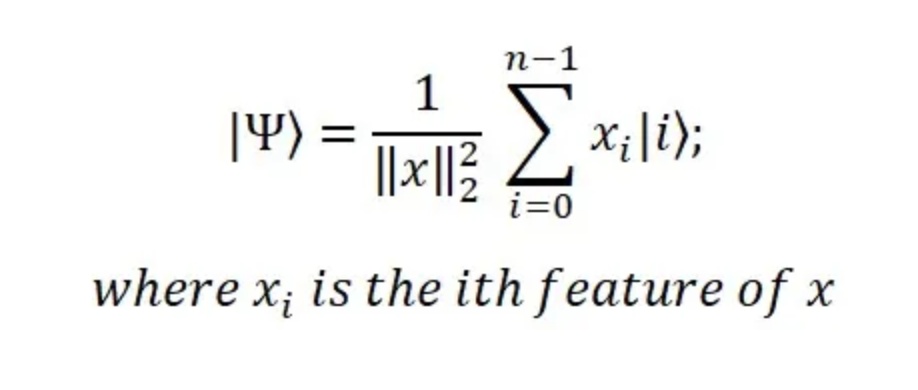

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Project2/amp.png',width=500,height=250)

In [ ]:
classical_vector = [1, 2, 3, 4]

norm = np.linalg.norm(classical_vector)
normalized_vector = [x / norm for x in classical_vector]

qc_amplitude = QuantumCircuit(2)

qc_amplitude.initialize(normalized_vector, qc_amplitude.qubits)

**B**

In [ ]:
!pip install pylatexenc==2.7

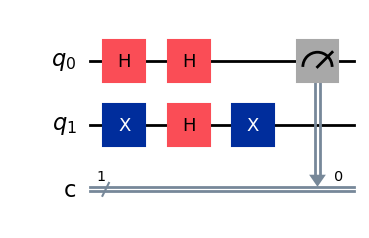

In [ ]:
from qiskit import *
from qiskit.visualization import plot_bloch_multivector, visualize_transition, plot_histogram
from pylatexenc import *

qc = QuantumCircuit(2, 1)
qc.x(1)
qc.h(0)
qc.h(1)
qc.x(1)
qc.h(0)

qc.measure(0, 0)

qc.draw('mpl')


In the first part both qubits are ∣0⟩ . Then we flip q1 to ∣1⟩ using a X gate. Then the H gates transform q0 to 1/rad(2) * (∣0⟩+∣1⟩) and the q1 to 1/rad(2) * (∣0⟩-∣1⟩). And after simplifying the result would be 0 that measures and got into the classical bit. In this circuit we always get 0 at the end.